In [4]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap

pd.set_option("display.max_columns", None)

#nrows_to_read = 100000

chunk_iterator = pd.read_csv('/content/drive/My Drive/data 490/points_reduced.csv', on_bad_lines='skip', chunksize=30000)

# Create an iterator for chunks of the CSV
#chunk_iterator = pd.read_csv(file_path, on_bad_lines='skip', chunksize=2000000)

# Get the first chunk
#first_chunk = next(chunk_iterator)

df = pd.DataFrame()

# Option 2: Initialize an empty DataFrame and then concatenate
for chunk in chunk_iterator:
  chunk_filtered = chunk[chunk['ST_ABBREV'] == 'TX']
  df = pd.concat([df, chunk_filtered], ignore_index=True)

df.reset_index(drop=True, inplace=True)
# Display the DataFrame
df


<ipython-input-5-bd60456d6556>:21: DtypeWarning: Columns (39) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iterator:
<ipython-input-5-bd60456d6556>:21: DtypeWarning: Columns (10,39) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iterator:
<ipython-input-5-bd60456d6556>:21: DtypeWarning: Columns (39) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iterator:
<ipython-input-5-bd60456d6556>:21: DtypeWarning: Columns (39) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iterator:
<ipython-input-5-bd60456d6556>:21: DtypeWarning: Columns (39) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_iterator:
<ipython-input-5-bd60456d6556>:21: DtypeWarning: Columns (16) have mixed types. Specify dtype option on import or set low_memory=False.
  for chunk in chunk_itera

,XCoord,YCoord,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,navigationPageLink,streetNumber,street,streetType,neighborhood,city,state,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceListed,priceLastKnown,normalPrice,pricePreClose,priceClosed,perSquareFoot,dateListed,daysOnMarket,buildingYearOpened,propertyType,queryString,Lot_Size,Style,Year_Built,Year_Renovated,Zoning,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID,NAME,ST_ABBREV,STATE_NAME
0,-96.661693,32.724910,20379,1,20379,204174,1.447900e+18,2,0,https://www.compass.com//listing/9228-homeplac...,9228,Homeplace,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.661693,32.724910,3.0,1.0,958.0,13329.0,225000.0,225000.0,225000.0,NaN,NaN,235.0,2023-11-19 00:00:00,28.0,1960.0,Single Family,NaN,13338.0,Single Family Residence,1960.0,NaN,Z298,958.0,13329.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
1,-96.668928,32.735207,20380,1,20380,204023,1.460431e+18,2,0,https://www.compass.com//listing/8741-woodcast...,8741,Woodcastle,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.668928,32.735207,2.0,1.0,786.0,7274.0,189000.0,188000.0,188500.0,NaN,NaN,239.0,2023-12-12 00:00:00,12.0,1949.0,Single Family,NaN,7280.0,Single Family Residence,1949.0,NaN,Z298,786.0,7274.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
2,-96.666010,32.726862,20381,1,20381,204021,1.447295e+18,2,0,https://www.compass.com//listing/520-north-pra...,520,Prairie Creek,Rd,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.666010,32.726862,NaN,NaN,NaN,12980.0,74990.0,74990.0,74990.0,NaN,NaN,NaN,2023-11-18 00:00:00,29.0,NaN,Land,NaN,12981.0,Commercial,NaN,NaN,Z298,NaN,12980.0,NaN,4.811301e+11,4.811301e+08,TX,Texas
3,-96.668761,32.721603,20382,1,20382,204020,1.445991e+18,2,0,https://www.compass.com//listing/630-cedarclif...,630,Cedarcliff,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.668761,32.721603,3.0,2.0,1273.0,14636.0,260000.0,260000.0,260000.0,NaN,NaN,204.0,2023-11-22 00:00:00,32.0,1958.0,Single Family,NaN,14640.0,Single Family Residence,1958.0,NaN,Z298,1273.0,14636.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
4,-96.673481,32.725128,20383,1,20383,204020,1.432762e+18,2,0,https://www.compass.com//listing/8518-eden-val...,8518,Eden Valley,Ln,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.673481,32.725128,4.0,2.0,1368.0,9060.0,265000.0,265000.0,265000.0,NaN,NaN,194.0,2023-11-12 00:00:00,30.0,1958.0,Single Family,NaN,9050.0,Single Family Residence,1958.0,NaN,Z298,1368.0,9060.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288263,-98.487312,29.517497,64686821,1,64686788,201557,5.926144e+16,2,10,https://www.compass.com//listing/511-east-rect...,511,Rector,St,Shearer Hills-Ridgeview,San Antonio,TX,78216,san_antonio,-98.487312,29.517497,3.0,2.0,1566.0,9147.0,170000.0,170000.0,169000.0,170000.0,166000.0,109.0,2017-04-23 00:00:00,38.0,1959.0,Single Family,NaN,9148.0,Single Family Residence,1959.0,NaN,NaN,1566.0,9147.0,0.0,4.802919e+11,4.802919e+08,TX,Texas
3288264,-96.986229,32.840833,64686822,1,64686789,204483,1.474854e+18,2,0,https://www.compass.com//listing/2507-harvard-...,2507,Harvard,St,Plymouth Park North,Irving,TX,75062,dallas,-96.986229,32.840833,4.0,2.0,2284.0,8450.0,384000.0,384000.0,384000.0,NaN,NaN,168.0,2023-12-27 00:00:00,6.0,1962.0,Single Family,NaN,8470.0,Single Family Residence,1962.0,NaN,Z324,1656.0,8450.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
3288265,-97.004929,32.953389,64686823,1,64686790,204412,1.469296e+18,2,0,https://www.compass.com//listing/720-south-cop...,720,Coppell,Rd,Coppell,Coppell,TX,75019,dallas,-97.004929,32.953389,3.0,4.0,2520.0,3615.0,699900.0,699900.0,699900.0,NaN,NaN,278.0,2023-12-20 00:00:00,11.0,2014.0,Single Family,NaN,NaN,Single Family Residence,2014.0,NaN,Z236,2520.0,3615.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
3288266,-97.687275,30.188868,64686

In [6]:
def missing_values_table(df):
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        return mis_val_table_ren_columns

In [7]:
missing_values_table(df)

Your selected dataframe has 47 columns.
There are 29 columns that have missing values.


,Missing Values,% of Total Values
queryString,3248605,98.8
Year_Renovated,2924178,88.9
Zoning,2763837,84.1
perSquareFoot,1320919,40.2
priceLastKnown,1201178,36.5
Lot_Size,553202,16.8
neighborhood,431346,13.1
lotSizeInSquareFeet,393853,12.0
Total_Finished_SqFt,369724,11.2
Year_Built,357325,10.9


In [8]:
# Get the columns with > 50% missing
missing_df = missing_values_table(df);
missing_columns = list(missing_df[missing_df['% of Total Values'] > 50].index)
print('We will remove %d columns.' % len(missing_columns))

Your selected dataframe has 47 columns.
There are 29 columns that have missing values.
We will remove 3 columns.


In [9]:
# Drop the columns
df = df.drop(list(missing_columns), axis = 1)

In [10]:
df

,XCoord,YCoord,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,navigationPageLink,streetNumber,street,streetType,neighborhood,city,state,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceListed,priceLastKnown,normalPrice,pricePreClose,priceClosed,perSquareFoot,dateListed,daysOnMarket,buildingYearOpened,propertyType,Lot_Size,Style,Year_Built,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID,NAME,ST_ABBREV,STATE_NAME
0,-96.661693,32.724910,20379,1,20379,204174,1.447900e+18,2,0,https://www.compass.com//listing/9228-homeplac...,9228,Homeplace,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.661693,32.724910,3.0,1.0,958.0,13329.0,225000.0,225000.0,225000.0,NaN,NaN,235.0,2023-11-19 00:00:00,28.0,1960.0,Single Family,13338.0,Single Family Residence,1960.0,958.0,13329.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
1,-96.668928,32.735207,20380,1,20380,204023,1.460431e+18,2,0,https://www.compass.com//listing/8741-woodcast...,8741,Woodcastle,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.668928,32.735207,2.0,1.0,786.0,7274.0,189000.0,188000.0,188500.0,NaN,NaN,239.0,2023-12-12 00:00:00,12.0,1949.0,Single Family,7280.0,Single Family Residence,1949.0,786.0,7274.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
2,-96.666010,32.726862,20381,1,20381,204021,1.447295e+18,2,0,https://www.compass.com//listing/520-north-pra...,520,Prairie Creek,Rd,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.666010,32.726862,NaN,NaN,NaN,12980.0,74990.0,74990.0,74990.0,NaN,NaN,NaN,2023-11-18 00:00:00,29.0,NaN,Land,12981.0,Commercial,NaN,NaN,12980.0,NaN,4.811301e+11,4.811301e+08,TX,Texas
3,-96.668761,32.721603,20382,1,20382,204020,1.445991e+18,2,0,https://www.compass.com//listing/630-cedarclif...,630,Cedarcliff,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.668761,32.721603,3.0,2.0,1273.0,14636.0,260000.0,260000.0,260000.0,NaN,NaN,204.0,2023-11-22 00:00:00,32.0,1958.0,Single Family,14640.0,Single Family Residence,1958.0,1273.0,14636.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
4,-96.673481,32.725128,20383,1,20383,204020,1.432762e+18,2,0,https://www.compass.com//listing/8518-eden-val...,8518,Eden Valley,Ln,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.673481,32.725128,4.0,2.0,1368.0,9060.0,265000.0,265000.0,265000.0,NaN,NaN,194.0,2023-11-12 00:00:00,30.0,1958.0,Single Family,9050.0,Single Family Residence,1958.0,1368.0,9060.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288263,-98.487312,29.517497,64686821,1,64686788,201557,5.926144e+16,2,10,https://www.compass.com//listing/511-east-rect...,511,Rector,St,Shearer Hills-Ridgeview,San Antonio,TX,78216,san_antonio,-98.487312,29.517497,3.0,2.0,1566.0,9147.0,170000.0,170000.0,169000.0,170000.0,166000.0,109.0,2017-04-23 00:00:00,38.0,1959.0,Single Family,9148.0,Single Family Residence,1959.0,1566.0,9147.0,0.0,4.802919e+11,4.802919e+08,TX,Texas
3288264,-96.986229,32.840833,64686822,1,64686789,204483,1.474854e+18,2,0,https://www.compass.com//listing/2507-harvard-...,2507,Harvard,St,Plymouth Park North,Irving,TX,75062,dallas,-96.986229,32.840833,4.0,2.0,2284.0,8450.0,384000.0,384000.0,384000.0,NaN,NaN,168.0,2023-12-27 00:00:00,6.0,1962.0,Single Family,8470.0,Single Family Residence,1962.0,1656.0,8450.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
3288265,-97.004929,32.953389,64686823,1,64686790,204412,1.469296e+18,2,0,https://www.compass.com//listing/720-south-cop...,720,Coppell,Rd,Coppell,Coppell,TX,75019,dallas,-97.004929,32.953389,3.0,4.0,2520.0,3615.0,699900.0,699900.0,699900.0,NaN,NaN,278.0,2023-12-20 00:00:00,11.0,2014.0,Single Family,NaN,Single Family Residence,2014.0,2520.0,3615.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
3288266,-97.687275,30.188868,64686996,1,64686963,216978,1.466762e+18,2,2,https://www.compass.com//listing/4308-norwood-...,4308,Norwood,Ln,Austin,Austin,TX,78744,austin,-97.687275,30.

**Largest House in Texas is 48,000 sqaure feet so anything larger is an outlier**

In [11]:
df = df[df['squareFeet'] <= 48001]
df

,XCoord,YCoord,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,navigationPageLink,streetNumber,street,streetType,neighborhood,city,state,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceListed,priceLastKnown,normalPrice,pricePreClose,priceClosed,perSquareFoot,dateListed,daysOnMarket,buildingYearOpened,propertyType,Lot_Size,Style,Year_Built,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID,NAME,ST_ABBREV,STATE_NAME
0,-96.661693,32.724910,20379,1,20379,204174,1.447900e+18,2,0,https://www.compass.com//listing/9228-homeplac...,9228,Homeplace,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.661693,32.724910,3.0,1.0,958.0,13329.0,225000.0,225000.0,225000.0,NaN,NaN,235.0,2023-11-19 00:00:00,28.0,1960.0,Single Family,13338.0,Single Family Residence,1960.0,958.0,13329.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
1,-96.668928,32.735207,20380,1,20380,204023,1.460431e+18,2,0,https://www.compass.com//listing/8741-woodcast...,8741,Woodcastle,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.668928,32.735207,2.0,1.0,786.0,7274.0,189000.0,188000.0,188500.0,NaN,NaN,239.0,2023-12-12 00:00:00,12.0,1949.0,Single Family,7280.0,Single Family Residence,1949.0,786.0,7274.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
3,-96.668761,32.721603,20382,1,20382,204020,1.445991e+18,2,0,https://www.compass.com//listing/630-cedarclif...,630,Cedarcliff,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.668761,32.721603,3.0,2.0,1273.0,14636.0,260000.0,260000.0,260000.0,NaN,NaN,204.0,2023-11-22 00:00:00,32.0,1958.0,Single Family,14640.0,Single Family Residence,1958.0,1273.0,14636.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
4,-96.673481,32.725128,20383,1,20383,204020,1.432762e+18,2,0,https://www.compass.com//listing/8518-eden-val...,8518,Eden Valley,Ln,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.673481,32.725128,4.0,2.0,1368.0,9060.0,265000.0,265000.0,265000.0,NaN,NaN,194.0,2023-11-12 00:00:00,30.0,1958.0,Single Family,9050.0,Single Family Residence,1958.0,1368.0,9060.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
5,-96.667633,32.723990,20384,1,20384,204020,1.413244e+18,2,0,https://www.compass.com//listing/8808-old-home...,8808,Old Homestead,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.667633,32.723990,3.0,2.0,1484.0,9321.0,289999.0,275999.0,282999.0,NaN,NaN,186.0,2023-11-07 00:00:00,77.0,1955.0,Single Family,9318.0,Single Family Residence,1955.0,1484.0,9321.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288262,-98.486326,29.517470,64686820,1,64686787,201557,4.259052e+17,2,10,https://www.compass.com//listing/527-east-rect...,527,Rector,St,Shearer Hills-Ridgeview,San Antonio,TX,78216,san_antonio,-98.486326,29.517470,3.0,2.0,1041.0,8276.0,160000.0,160000.0,160800.0,160000.0,163200.0,154.0,2020-01-22 00:00:00,18.0,1959.0,Single Family,8451.0,Single Family Residence,1959.0,1041.0,8276.0,0.0,4.802919e+11,4.802919e+08,TX,Texas
3288263,-98.487312,29.517497,64686821,1,64686788,201557,5.926144e+16,2,10,https://www.compass.com//listing/511-east-rect...,511,Rector,St,Shearer Hills-Ridgeview,San Antonio,TX,78216,san_antonio,-98.487312,29.517497,3.0,2.0,1566.0,9147.0,170000.0,170000.0,169000.0,170000.0,166000.0,109.0,2017-04-23 00:00:00,38.0,1959.0,Single Family,9148.0,Single Family Residence,1959.0,1566.0,9147.0,0.0,4.802919e+11,4.802919e+08,TX,Texas
3288264,-96.986229,32.840833,64686822,1,64686789,204483,1.474854e+18,2,0,https://www.compass.com//listing/2507-harvard-...,2507,Harvard,St,Plymouth Park North,Irving,TX,75062,dallas,-96.986229,32.840833,4.0,2.0,2284.0,8450.0,384000.0,384000.0,384000.0,NaN,NaN,168.0,2023-12-27 00:00:00,6.0,1962.0,Single Family,8470.0,Single Family Residence,1962.0,1656.0,8450.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
3288265,-97.004929,32.953389,64686823,1,64686790,204412,1.469296e+18,2,0,https://www.compass.com//listing/72

#Subset dataframe for model usage

In [12]:
df_subset = df.sample(n=10000)

In [13]:
df_subset = df_subset.drop('state', axis=1)
df_subset = df_subset.drop('ST_ABBREV', axis=1)
df_subset = df_subset.drop('STATE_NAME', axis=1)
df_subset = df_subset.drop('NAME', axis=1)
df_subset = df_subset.drop('navigationPageLink', axis=1)
df_subset = df_subset.drop('priceListed', axis=1)
df_subset = df_subset.drop('normalPrice', axis=1)
df_subset = df_subset.drop('pricePreClose', axis=1)
df_subset = df_subset.drop('priceClosed', axis=1)
df_subset = df_subset.drop('perSquareFoot', axis=1)
df_subset = df_subset.drop('OBJECTID', axis=1)
df_subset = df_subset.drop('Join_Count', axis=1)
df_subset

,XCoord,YCoord,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,streetNumber,street,streetType,neighborhood,city,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceLastKnown,dateListed,daysOnMarket,buildingYearOpened,propertyType,Lot_Size,Style,Year_Built,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID
2307263,-95.357340,29.812539,36212250,207929,2.421579e+16,2,10,1102,Bragg,St,Ryon,Houston,77009,houston,-95.357340,29.812539,2.0,1.0,1106.0,9375.0,NaN,2005-07-27 00:00:00,46.0,1940.0,Single Family,9374.0,Single Family Residence,1940.0,1106.0,9375.0,0.0,4.820121e+11
863065,-98.523552,29.801242,17024445,203500,7.312506e+17,2,10,3129,Skipton,Park,Ventana,Bulverde,78163.0,austin,-98.523552,29.801242,4.0,3.0,2337.0,7187.0,480563.0,2021-05-19 00:00:00,48.0,2021.0,Single Family,6970.0,Single Family Residence,2021.0,2306.0,7187.0,1.0,4.809131e+11
2146998,-97.341963,32.623898,32801757,215589,2.525400e+16,2,10,1508,Eastview,St,Lincolnshire,Fort Worth,76134,dallas,-97.341963,32.623898,3.0,2.0,1418.0,3920.0,94900.0,2014-08-29 00:00:00,31.0,1986.0,Single Family,3925.0,Single Family Residence,1986.0,1418.0,3920.0,0.0,4.843911e+11
2110349,-97.684678,30.630798,31773998,218397,2.552258e+16,2,10,1501,Scenic,Dr,Georgetown,Georgetown,78626,austin,-97.684678,30.630798,3.0,2.0,1406.0,9583.0,99900.0,2008-06-12 00:00:00,13.0,1975.0,Single Family,9583.0,Single Family Residence,1975.0,1406.0,9583.0,0.0,4.849102e+11
2157369,-97.255173,32.884221,33172002,216065,2.524757e+16,2,10,7732,Liz,Ln,Watauga,Watauga,76148,dallas,-97.255173,32.884221,3.0,2.0,1337.0,5967.0,120000.0,2007-10-24 00:00:00,50.0,1997.0,Single Family,5998.0,Single Family Residence,1997.0,1337.0,5967.0,0.0,4.843911e+11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6844,-98.369370,29.469337,77739,200846,7.377741e+16,2,10,4506,Todds,Farm,Meadow Park,San Antonio,78244.0,san_antonio,-98.369370,29.469337,3.0,2.0,1733.0,7405.0,180510.0,2016-09-30 00:00:00,92.0,2015.0,Single Family,5271.0,Single Family Residence,2015.0,1715.0,7405.0,1.0,4.802913e+11
188543,-96.816131,33.166056,3550942,202876,8.868792e+17,2,10,7753,Red Clover,Dr,Frisco,Frisco,75033.0,dallas,-96.816131,33.166056,4.0,4.0,3692.0,12196.0,680000.0,2021-11-28 00:00:00,44.0,2001.0,Single Family,NaN,Single Family Residence,2001.0,3693.0,12196.0,0.0,4.808503e+11
853920,-95.636800,29.748846,16777205,209683,2.555007e+16,2,10,14223,Summer Rose,Ln,Lakes of Parkway,Houston,77077.0,houston,-95.636800,29.748846,4.0,4.0,3918.0,7500.0,NaN,2004-08-23 00:00:00,70.0,2002.0,Single Family,7501.0,Single Family Residence,2002.0,3970.0,7500.0,1.0,4.820145e+11
2135477,-97.202749,32.741482,32409385,215190,2.530311e+16,2,10,7237,Greenlee,St,Handley,Fort Worth,76112,dallas,-97.202749,32.741482,3.0,1.0,910.0,6795.0,70000.0,2008-07-21 00:00:00,146.0,1959.0,Single Family,6778.0,Single Family Residence,1959.0,936.0,6795.0,0.0,4.843910e+11


# Read in Demographics

In [14]:
pd.set_option("display.max_columns", None)

# Specify the columns you want to read
columns_to_read = ['OID_', 'State_Abbreviation', 'Geography_ID', 'Geography_Name', '2023_Total_Population__Esri_', '2023_Household_Population__Esri_', '2023_Family_Population__Esri_', '2023_Group_Quarters_Population__Esri_', '2023_Population_Density__Pop_per_Square_Mile___Esri_','2023_Total_Households__Esri_', '2023_Average_Household_Size__Esri_', '2023_Total_Family_Households__Esri_', '2023_Average_Family_Size__Esri_', '2023_Total_Housing_Units__Esri_', '2023_Owner_Occupied_Housing_Units__Esri_', '2023_Renter_Occupied_Housing_Units__Esri_', '2023_Vacant_Housing_Units__Esri_', '2020_2023_Population__Compound_Annual_Growth_Rate__Esri_', '2020_2023_Households__Compound_Annual_Growth_Rate__Esri_', '2020_2023_Household_Population__Compound_Annual_Growth_Rate__Esri_', '2020_2023_Group_Quarters_Population__Compound_Annual_Growth_Rate__Esri_', '2020_2023_Housing_Units__Compound_Annual_Growth_Rate__Esri_', '2020_2023_Vacant_Housing_Units__Compound_Annual_Growth_Rate__Esri_', '2023_Housing_Affordability_Index__Esri_', '2023_Percent_of_Income_for_Mortgage__Esri_', '2023_Wealth_Index__Esri_', '2023_Socioeconomic_Status_Index__Esri_']
#nrows_to_read = 100000
#nrows=nrows_to_read
# Read the CSV file with only the specified columns
#selected_columns_df = pd.read_csv('data.csv', usecols=columns_to_read)

chunk_iterator = pd.read_csv('/content/drive/My Drive/data 490/Demographics_2023__12.csv', on_bad_lines='skip', usecols=columns_to_read, chunksize=10000)

df_demographics = pd.DataFrame()

# Option 2: Initialize an empty DataFrame and then concatenate
for chunk in chunk_iterator:
  chunk_filtered = chunk[chunk['State_Abbreviation'] == 'TX']
  df_demographics = pd.concat([df_demographics, chunk_filtered], ignore_index=True)

df_demographics.reset_index(drop=True, inplace=True)
# Display the DataFrame
df_demographics

,OID_,Geography_ID,Geography_Name,State_Abbreviation,2023_Total_Population__Esri_,2023_Household_Population__Esri_,2023_Family_Population__Esri_,2023_Group_Quarters_Population__Esri_,2023_Population_Density__Pop_per_Square_Mile___Esri_,2023_Total_Households__Esri_,2023_Average_Household_Size__Esri_,2023_Total_Family_Households__Esri_,2023_Average_Family_Size__Esri_,2023_Total_Housing_Units__Esri_,2023_Owner_Occupied_Housing_Units__Esri_,2023_Renter_Occupied_Housing_Units__Esri_,2023_Vacant_Housing_Units__Esri_,2020_2023_Population__Compound_Annual_Growth_Rate__Esri_,2020_2023_Households__Compound_Annual_Growth_Rate__Esri_,2020_2023_Household_Population__Compound_Annual_Growth_Rate__Esri_,2020_2023_Group_Quarters_Population__Compound_Annual_Growth_Rate__Esri_,2020_2023_Housing_Units__Compound_Annual_Growth_Rate__Esri_,2020_2023_Vacant_Housing_Units__Compound_Annual_Growth_Rate__Esri_,2023_Housing_Affordability_Index__Esri_,2023_Percent_of_Income_for_Mortgage__Esri_,2023_Wealth_Index__Esri_,2023_Socioeconomic_Status_Index__Esri_
0,199983,480019501001,4.800195e+08,TX,1186,1186,972,0,203.7,510,2.33,337,2.88,598,408,102,88,-0.26,-0.12,-0.26,0.0,-0.15,-0.35,261,9.0,49,45.1
1,199984,480019501002,4.800195e+08,TX,1945,1945,1651,0,22.1,788,2.47,558,2.96,969,726,62,181,-0.27,-0.12,-0.27,0.0,-0.13,-0.17,195,12.0,103,44.7
2,199985,480019501003,4.800195e+08,TX,1531,1531,1303,0,16.5,619,2.47,430,3.03,721,557,62,102,0.98,1.12,0.98,0.0,1.09,0.92,112,20.9,71,51.6
3,199986,480019504011,4.800195e+08,TX,5773,190,166,5583,905.7,72,2.64,53,3.13,98,24,48,26,-0.05,0.00,-1.41,0.0,0.00,0.00,0,0.0,49,56.6
4,199987,480019504021,4.800195e+08,TX,7102,5,5,7097,258.6,2,2.50,2,2.50,2,0,2,0,-0.06,23.77,-32.57,0.0,0.00,-100.00,0,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18620,218603,485079503021,4.850795e+08,TX,1856,1856,1673,0,291.4,631,2.94,496,3.37,743,470,161,112,-1.16,-0.72,-1.16,0.0,-0.33,2.01,211,10.9,29,34.1
18621,218604,485079503022,4.850795e+08,TX,795,795,700,0,3607.1,279,2.85,211,3.32,337,250,29,58,-1.75,-0.76,-1.75,0.0,-0.36,1.65,90,25.4,23,46.2
18622,218605,485079503023,4.850795e+08,TX,1098,1098,970,0,2416.9,402,2.73,304,3.19,472,301,101,70,-1.15,-0.68,-1.15,0.0,-0.32,1.83,238,9.6,59,43.6
18623,218606,485079503024,4.850795e+08,TX,841,812,719,29,2922.2,273,2.97,206,3.49,309,252,21,36,-1.00,-0.78,-1.04,0.0,-0.39,2.71,317,7.2,46,51.6


In [15]:
def missing_values_table(df_demographics):
        mis_val = df_demographics.isnull().sum()
        mis_val_percent = 100 * df_demographics.isnull().sum() / len(df_demographics)
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        return mis_val_table_ren_columns

In [16]:
missing_values_table(df_demographics)

Your selected dataframe has 44 columns.
There are 0 columns that have missing values.


,Missing Values,% of Total Values


In [17]:
# Get the columns with > 50% missing
missing_df = missing_values_table(df);
missing_columns = list(missing_df[missing_df['% of Total Values'] > 50].index)
print('We will remove %d columns.' % len(missing_columns))

Your selected dataframe has 44 columns.
There are 25 columns that have missing values.
We will remove 0 columns.


In [18]:
df_demographics

,OID_,Geography_ID,Geography_Name,State_Abbreviation,2023_Total_Population__Esri_,2023_Household_Population__Esri_,2023_Family_Population__Esri_,2023_Group_Quarters_Population__Esri_,2023_Population_Density__Pop_per_Square_Mile___Esri_,2023_Total_Households__Esri_,2023_Average_Household_Size__Esri_,2023_Total_Family_Households__Esri_,2023_Average_Family_Size__Esri_,2023_Total_Housing_Units__Esri_,2023_Owner_Occupied_Housing_Units__Esri_,2023_Renter_Occupied_Housing_Units__Esri_,2023_Vacant_Housing_Units__Esri_,2020_2023_Population__Compound_Annual_Growth_Rate__Esri_,2020_2023_Households__Compound_Annual_Growth_Rate__Esri_,2020_2023_Household_Population__Compound_Annual_Growth_Rate__Esri_,2020_2023_Group_Quarters_Population__Compound_Annual_Growth_Rate__Esri_,2020_2023_Housing_Units__Compound_Annual_Growth_Rate__Esri_,2020_2023_Vacant_Housing_Units__Compound_Annual_Growth_Rate__Esri_,2023_Housing_Affordability_Index__Esri_,2023_Percent_of_Income_for_Mortgage__Esri_,2023_Wealth_Index__Esri_,2023_Socioeconomic_Status_Index__Esri_
0,199983,480019501001,4.800195e+08,TX,1186,1186,972,0,203.7,510,2.33,337,2.88,598,408,102,88,-0.26,-0.12,-0.26,0.0,-0.15,-0.35,261,9.0,49,45.1
1,199984,480019501002,4.800195e+08,TX,1945,1945,1651,0,22.1,788,2.47,558,2.96,969,726,62,181,-0.27,-0.12,-0.27,0.0,-0.13,-0.17,195,12.0,103,44.7
2,199985,480019501003,4.800195e+08,TX,1531,1531,1303,0,16.5,619,2.47,430,3.03,721,557,62,102,0.98,1.12,0.98,0.0,1.09,0.92,112,20.9,71,51.6
3,199986,480019504011,4.800195e+08,TX,5773,190,166,5583,905.7,72,2.64,53,3.13,98,24,48,26,-0.05,0.00,-1.41,0.0,0.00,0.00,0,0.0,49,56.6
4,199987,480019504021,4.800195e+08,TX,7102,5,5,7097,258.6,2,2.50,2,2.50,2,0,2,0,-0.06,23.77,-32.57,0.0,0.00,-100.00,0,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18620,218603,485079503021,4.850795e+08,TX,1856,1856,1673,0,291.4,631,2.94,496,3.37,743,470,161,112,-1.16,-0.72,-1.16,0.0,-0.33,2.01,211,10.9,29,34.1
18621,218604,485079503022,4.850795e+08,TX,795,795,700,0,3607.1,279,2.85,211,3.32,337,250,29,58,-1.75,-0.76,-1.75,0.0,-0.36,1.65,90,25.4,23,46.2
18622,218605,485079503023,4.850795e+08,TX,1098,1098,970,0,2416.9,402,2.73,304,3.19,472,301,101,70,-1.15,-0.68,-1.15,0.0,-0.32,1.83,238,9.6,59,43.6
18623,218606,485079503024,4.850795e+08,TX,841,812,719,29,2922.2,273,2.97,206,3.49,309,252,21,36,-1.00,-0.78,-1.04,0.0,-0.39,2.71,317,7.2,46,51.6


# Subset the demographics dataframe for model usage

In [19]:
demographics_subset = df_demographics.sample(n=10000)

# Left Join files together

In [20]:
left_join_df = pd.merge(df_subset, demographics_subset, left_on='ID', right_on='Geography_ID', how='left')
left_join_df

,XCoord,YCoord,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,streetNumber,street,streetType,neighborhood,city,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceLastKnown,dateListed,daysOnMarket,buildingYearOpened,propertyType,Lot_Size,Style,Year_Built,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID,OID_,Geography_ID,Geography_Name,State_Abbreviation,2023_Total_Population__Esri_,2023_Household_Population__Esri_,2023_Family_Population__Esri_,2023_Group_Quarters_Population__Esri_,2023_Population_Density__Pop_per_Square_Mile___Esri_,2023_Total_Households__Esri_,2023_Average_Household_Size__Esri_,2023_Total_Family_Households__Esri_,2023_Average_Family_Size__Esri_,2023_Total_Housing_Units__Esri_,2023_Owner_Occupied_Housing_Units__Esri_,2023_Renter_Occupied_Housing_Units__Esri_,2023_Vacant_Housing_Units__Esri_,2020_2023_Population__Compound_Annual_Growth_Rate__Esri_,2020_2023_Households__Compound_Annual_Growth_Rate__Esri_,2020_2023_Household_Population__Compound_Annual_Growth_Rate__Esri_,2020_2023_Group_Quarters_Population__Compound_Annual_Growth_Rate__Esri_,2020_2023_Housing_Units__Compound_Annual_Growth_Rate__Esri_,2020_2023_Vacant_Housing_Units__Compound_Annual_Growth_Rate__Esri_,2023_Housing_Affordability_Index__Esri_,2023_Percent_of_Income_for_Mortgage__Esri_,2023_Wealth_Index__Esri_,2023_Socioeconomic_Status_Index__Esri_
0,-95.357340,29.812539,36212250,207929,2.421579e+16,2,10,1102,Bragg,St,Ryon,Houston,77009,houston,-95.357340,29.812539,2.0,1.0,1106.0,9375.0,NaN,2005-07-27 00:00:00,46.0,1940.0,Single Family,9374.0,Single Family Residence,1940.0,1106.0,9375.0,0.0,4.820121e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-98.523552,29.801242,17024445,203500,7.312506e+17,2,10,3129,Skipton,Park,Ventana,Bulverde,78163.0,austin,-98.523552,29.801242,4.0,3.0,2337.0,7187.0,480563.0,2021-05-19 00:00:00,48.0,2021.0,Single Family,6970.0,Single Family Residence,2021.0,2306.0,7187.0,1.0,4.809131e+11,203500.0,4.809131e+11,4.809131e+08,TX,2838.0,2797.0,2450.0,41.0,178.2,1018.0,2.75,752.0,3.26,1104.0,771.0,247.0,86.0,15.94,16.60,16.26,0.0,16.66,17.44,123.0,18.4,206.0,60.3
2,-97.341963,32.623898,32801757,215589,2.525400e+16,2,10,1508,Eastview,St,Lincolnshire,Fort Worth,76134,dallas,-97.341963,32.623898,3.0,2.0,1418.0,3920.0,94900.0,2014-08-29 00:00:00,31.0,1986.0,Single Family,3925.0,Single Family Residence,1986.0,1418.0,3920.0,0.0,4.843911e+11,215589.0,4.843911e+11,4.843911e+08,TX,1423.0,1423.0,1266.0,0.0,1343.1,437.0,3.26,331.0,3.82,455.0,316.0,121.0,18.0,0.24,0.21,0.24,0.0,0.20,0.00,127.0,16.4,51.0,44.3
3,-97.684678,30.630798,31773998,218397,2.552258e+16,2,10,1501,Scenic,Dr,Georgetown,Georgetown,78626,austin,-97.684678,30.630798,3.0,2.0,1406.0,9583.0,99900.0,2008-06-12 00:00:00,13.0,1975.0,Single Family,9583.0,Single Family Residence,1975.0,1406.0,9583.0,0.0,4.849102e+11,218397.0,4.849102e+11,4.849102e+08,TX,486.0,486.0,353.0,0.0,4335.4,241.0,2.02,118.0,2.99,257.0,124.0,117.0,16.0,-2.12,-0.51,-2.12,0.0,-1.05,-8.03,37.0,63.4,74.0,56.7
4,-97.255173,32.884221,33172002,216065,2.524757e+16,2,10,7732,Liz,Ln,Watauga,Watauga,76148,dallas,-97.255173,32.884221,3.0,2.0,1337.0,5967.0,120000.0,2007-10-24 00:00:00,50.0,1997.0,Single Family,5998.0,Single Family Residence,1997.0,1337.0,5967.0,0.0,4.843911e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,-98.369370,29.469337,77739,200846,7.377741e+16,2,10,4506,Todds,Farm,Meadow Park,San Antonio,78244.0,san_antonio,-98.369370,29.469337,3.0,2.0,1733.0,7405.0,180510.0,2016-09-30 00:00:00,92.0,2015.0,Single Family,5271.0,Single Family Residence,2015.0,1715.0,7405.0,1.0,4.802913e+11,2

# Models

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

left_join_df
# Drop rows with NaN values
left_join_df.dropna(inplace=True)

float_columns = left_join_df.select_dtypes(include=['float']).columns
df_floats = left_join_df[float_columns]

# Putting feature variable to X
X = df_floats.drop('priceLastKnown',axis=1)
# Putting response variable to y
y = df_floats['priceLastKnown']

# Splitting the data into train and test
from sklearn.model_selection import train_test_split
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, random_state=42)

In [ ]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier
#Create a Gaussian Classifier
clf=RandomForestClassifier(n_estimators=10)
#Train the model using the training sets y_pred=clf.predict(X_test)
clf.fit(X_train,y_train)

# Predicting the test set results
Pred = clf.predict(X_test)
print(Pred)

[  78440.  149900.  590000.   69900.  230000.   84900.  215000.   99900.
  925000.  107000.  499900.  109000.   64900.   35000.  209900.  169900.
  154900.  185000.  230000.   78500.  538000.  200000.  114950.  133900.
  561433.  175000.   25000.  159990. 1449000.   49900.  115000.  112000.
  365000.  230000.  209900.  168000.  239000.  154900.   88500.  625000.
   78500.  580000.  202000.  598000.  359900.  290000.  118000.   56900.
 1115000.  133000.  227500.  195900.  490000.  325000.  199999.  135500.
  290000.  227500.  525000.  419306.  275000.  276000.   69900.  160000.
  240000.   87000.  220000.   92000.  595000.  577000.  299000.  339900.
   25000.  161383.  235000.  350000.  189900.  165000.  324900.  190300.
  167000.  120000.  164800.  925000.  225000.  176900.   56900.  259900.
  139900.  220000.  188000.  107000.  113000.  399900.  499500.  100000.
  134900.  149900.  172800.  189900.  164000.   41900.   49900.  142800.
   99900.  449000.  159900.  209900.  106900.  2200

In [ ]:
from sklearn.metrics import classification_report
rand_score=clf.score(X_test, y_test)
'''rand_score=classifier.accuracy_score(y_test,Pred)'''
classification_report_rf=classification_report(y_test,Pred)
print("Accuracy score:",rand_score)

Accuracy score: 0.004559270516717325


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

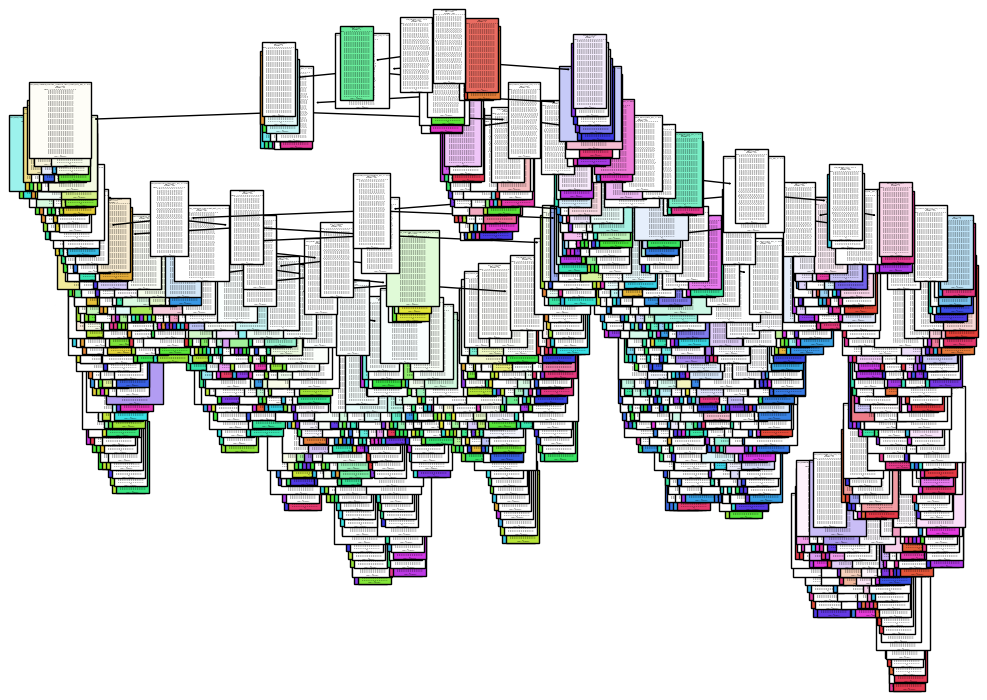

In [ ]:
from sklearn import tree

# Selecting a single decision tree from the random forest (e.g., the first tree)
tree_in_forest = clf.estimators_[0]
y = y.astype(str)
# Visualize the selected decision tree
plt.figure(figsize=(12, 8))
tree.plot_tree(tree_in_forest, feature_names=X.columns, class_names=y.unique().tolist(), filled=True)
plt.show()


In [ ]:
# Get feature importances from the trained random forest model
feature_importances = clf.feature_importances_

# Create a DataFrame to store feature importances along with their corresponding feature names
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance scores in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Print out the top features
print("Top features for predicting the target variable:")
print(feature_importance_df.head())


Top features for predicting the target variable:
                Feature  Importance
2          listingIdSHA    0.038328
13  Total_Finished_SqFt    0.035576
7            squareFeet    0.032514
3             longitude    0.030920
1                YCoord    0.030806


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


In [ ]:
# Load dataset
data = df_subset

# Separate features and target variable
X = data.drop('priceLastKnown', axis=1)
y = data['priceLastKnown']


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# Initialize decision tree classifier
dt_classifier = DecisionTreeClassifier(random_state=42)

# Train the model
dt_classifier.fit(X_train, y_train)


ValueError: could not convert string to float: 'https://www.compass.com//listing/1942-knoxbridge-road-forney-tx-75126/163086386272985313/'

In [ ]:
# Make predictions on the test set
predictions = dt_classifier.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, predictions)
print("Accuracy:", accuracy)

# Additional evaluation metrics
print(classification_report(y_test, predictions))
print(confusion_matrix(y_test, predictions))


In [ ]:
# Calculate correlation coefficient
correlation = left_join_df['priceListed'].corr(left_join_df['propertyType'])

print("Correlation coefficient:", correlation)

# Interpret the correlation
if correlation > 0.7:
    print("There is a strong positive correlation.")
elif correlation < -0.7:
    print("There is a strong negative correlation.")
elif correlation > 0.3:
    print("There is a moderate positive correlation.")
elif correlation < -0.3:
    print("There is a moderate negative correlation.")
else:
    print("There is no significant correlation.")

KeyboardInterrupt: 

In [ ]:
grouped_cities = pd.DataFrame()
grouped_cities = left_join_df.groupby('city')

selected_columns = ['bedrooms', 'bathrooms', 'lotSizeInSquareFeet', 'priceListed', 'priceLastKnown', 'daysOnMarket', 'buildingYearOpened', 'Year_Built', ]
selected_grouped_cities = grouped_cities[selected_columns]

selected_grouped_cities.describe()



bedrooms                                                  \
               count      mean       std  min   25%  50%   75%   max   
city                                                                   
Abbott           1.0  3.000000       NaN  3.0  3.00  3.0  3.00   3.0   
Absecon          2.0  3.500000  0.707107  3.0  3.25  3.5  3.75   4.0   
Accord           1.0  3.000000       NaN  3.0  3.00  3.0  3.00   3.0   
Acworth          1.0  3.000000       NaN  3.0  3.00  3.0  3.00   3.0   
Addison       1730.0  2.598266  1.054280  1.0  2.00  3.0  3.00  35.0   
...              ...       ...       ...  ...   ...  ...   ...   ...   
Yulee            2.0  3.000000  0.000000  3.0  3.00  3.0  3.00   3.0   
Zebulon          1.0  3.000000       NaN  3.0  3.00  3.0  3.00   3.0   
Zephyrhills    134.0  2.761194  0.796412  1.0  2.00  3.0  3.00   5.0   
Zillah           0.0       NaN       NaN  NaN   NaN  NaN   NaN   NaN   
Zimmerman        1.0  2.000000       NaN  2.0  2.00  2.0  2.00   2.0   

            bathrooms                                               \
                count      mean       std  min  25%  50%  75%  max   
city                                                                 
Abbott            1.0  2.000000       NaN  2.0  2.0  2.0  2.0  2.0   
Absecon           2.0  3.000000  1.414214  2.0  2.5  3.0  3.5  4.0   
Accord            1.0  2.000000       NaN  2.0  2.0  2.0  2.0  2.0   
Acworth           1.0  3.000000       NaN  3.0  3.0  3.0  3.0  3.0   
Addison        1728.0  2.248264  0.716460  1.0  2.0  2.0  2.0  8.0   
...               ...       ...       ...  ...  ...  ...  ...  ...   
Yulee             2.0  2.000000  0.000000  2.0  2.0  2.0  2.0  2.0   
Zebulon           1.0  2.000000       NaN  2.0  2.0  2.0  2.0  2.0   
Zephyrhills     136.0  2.022059  0.412165  1.0  2.0  2.0  2.0  5.0   
Zillah            0.0       NaN       NaN  NaN  NaN  NaN  NaN  NaN   
Zimmerman         1.0  1.000000       NaN  1.0  1.0  1.0  1.0  1.0   

            lotSizeInSquareFeet                                         \
                          count           mean           std       min   
city                                                                     
Abbott                      0.0            NaN           NaN       NaN   
Absecon                     2.0   13305.000000   2128.391411   11800.0   
Accord                      1.0  115434.000000           NaN  115434.0   
Acworth                     1.0    4791.000000           NaN    4791.0   
Addison                  1055.0   15017.806635  58625.843886       0.0   
...                         ...            ...           ...       ...   
Yulee                       0.0            NaN           NaN       NaN   
Zebulon                     1.0   14810.000000           NaN   14810.0   
Zephyrhills               130.0   23606.969231  39460.461808    2871.0   
Zillah                      1.0    9583.000000           NaN    9583.0   
Zimmerman                   1.0       0.000000           NaN       0.0   

                                                       priceListed  \
                   25%       50%        75%        max       count   
city                                                                 
Abbott             NaN       NaN        NaN        NaN         1.0   
Absecon       12552.50   13305.0   14057.50    14810.0         2.0   
Accord       115434.00  115434.0  115434.00   115434.0         1.0   
Acworth        4791.00    4791.0    4791.00     4791.0         1.0   
Addison        1676.50    4181.0    5749.00  1089000.0      1732.0   
...                ...       ...        ...        ...         ...   
Yulee              NaN       NaN        NaN        NaN         2.0   
Zebulon       14810.00   14810.0   14810.00    14810.0         1.0   
Zephyrhills    4845.75    7189.0   18688.75   217800.0       132.0   
Zillah         9583.00    9583.0    9583.00     9583.0         0.0   
Zimmerman         0.00       0.0       0.00        0.0         1.0   

    

In [ ]:
lat_lon_pairs = list(zip(list(df.latitude), list(df.longitude)))
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

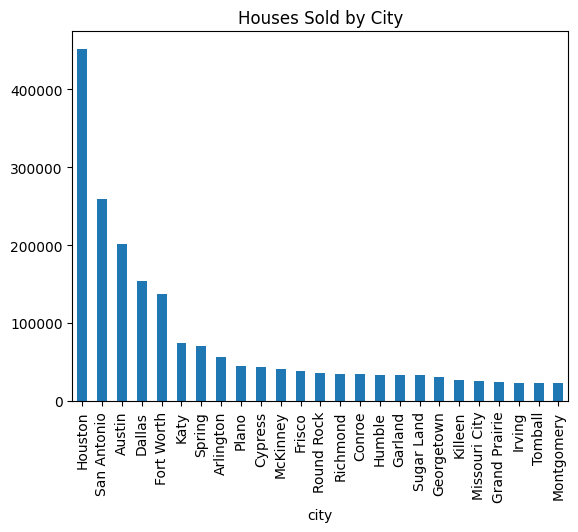

In [ ]:
city_by_houses = df['city'].value_counts()[:25].plot.bar(title='Houses Sold by City')

<Axes: title={'center': 'Bed & Bath combo by City'}, xlabel='city,bedrooms,bathrooms'>

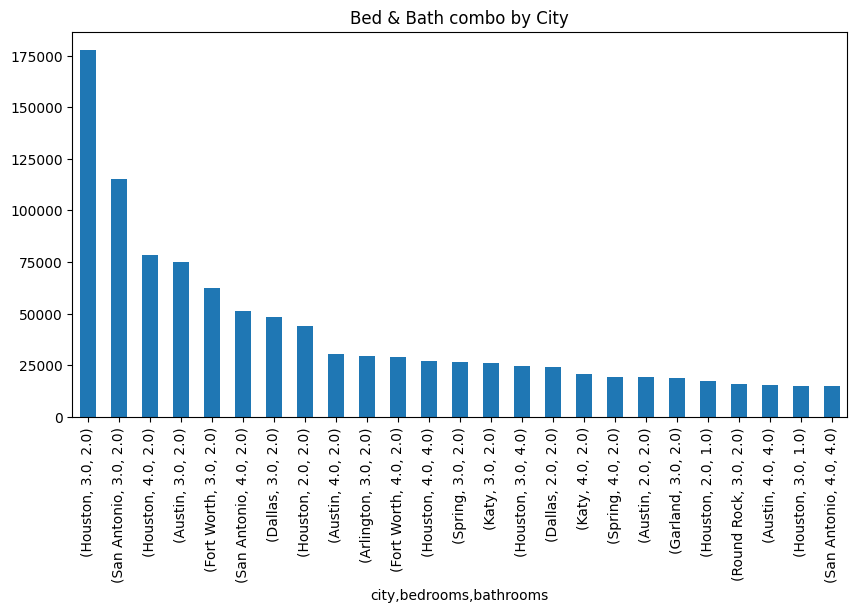

In [ ]:
filtered_df = df.groupby(['city', 'bedrooms','bathrooms'])
filtered_df.city.value_counts().nlargest(25).plot(kind='bar', title = "Bed & Bath combo by City", figsize=(10,5))

# **I-35 Exploration**

**Dallas**

In [ ]:
df_dallas = df[df['city'] == 'Dallas']
df_dallas

,XCoord,YCoord,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,navigationPageLink,streetNumber,street,streetType,neighborhood,city,state,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceListed,priceLastKnown,normalPrice,pricePreClose,priceClosed,perSquareFoot,dateListed,daysOnMarket,buildingYearOpened,propertyType,Lot_Size,Style,Year_Built,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID,NAME,ST_ABBREV,STATE_NAME
0,-96.661693,32.724910,20379,1,20379,204174,1.447900e+18,2,0,https://www.compass.com//listing/9228-homeplac...,9228,Homeplace,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.661693,32.724910,3.0,1.0,958.0,13329.0,225000.0,225000.0,225000.0,NaN,NaN,235.0,2023-11-19 00:00:00,28.0,1960.0,Single Family,13338.0,Single Family Residence,1960.0,958.0,13329.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
1,-96.668928,32.735207,20380,1,20380,204023,1.460431e+18,2,0,https://www.compass.com//listing/8741-woodcast...,8741,Woodcastle,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.668928,32.735207,2.0,1.0,786.0,7274.0,189000.0,188000.0,188500.0,NaN,NaN,239.0,2023-12-12 00:00:00,12.0,1949.0,Single Family,7280.0,Single Family Residence,1949.0,786.0,7274.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
3,-96.668761,32.721603,20382,1,20382,204020,1.445991e+18,2,0,https://www.compass.com//listing/630-cedarclif...,630,Cedarcliff,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.668761,32.721603,3.0,2.0,1273.0,14636.0,260000.0,260000.0,260000.0,NaN,NaN,204.0,2023-11-22 00:00:00,32.0,1958.0,Single Family,14640.0,Single Family Residence,1958.0,1273.0,14636.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
4,-96.673481,32.725128,20383,1,20383,204020,1.432762e+18,2,0,https://www.compass.com//listing/8518-eden-val...,8518,Eden Valley,Ln,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.673481,32.725128,4.0,2.0,1368.0,9060.0,265000.0,265000.0,265000.0,NaN,NaN,194.0,2023-11-12 00:00:00,30.0,1958.0,Single Family,9050.0,Single Family Residence,1958.0,1368.0,9060.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
5,-96.667633,32.723990,20384,1,20384,204020,1.413244e+18,2,0,https://www.compass.com//listing/8808-old-home...,8808,Old Homestead,Dr,Pleasant Grove,Dallas,TX,75217.0,dallas,-96.667633,32.723990,3.0,2.0,1484.0,9321.0,289999.0,275999.0,282999.0,NaN,NaN,186.0,2023-11-07 00:00:00,77.0,1955.0,Single Family,9318.0,Single Family Residence,1955.0,1484.0,9321.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3286251,-96.772090,32.884007,64480986,1,64480954,204267,4.793117e+18,2,10,https://www.compass.com//listing/10017-regal-p...,10017,Regal Park,Ln,North Dallas,Dallas,TX,75230,dallas,-96.772090,32.884007,1.0,1.0,718.0,NaN,49500.0,49500.0,47750.0,49500.0,42500.0,69.0,2008-09-08 00:00:00,13.0,1964.0,Condo,NaN,NaN,NaN,NaN,NaN,0.0,4.811301e+11,4.811301e+08,TX,Texas
3286252,-96.772135,32.884007,64480987,1,64480955,204267,4.793118e+18,2,10,https://www.compass.com//listing/10017-regal-p...,10017,Regal Park,Ln,North Dallas,Dallas,TX,75230,dallas,-96.772135,32.884007,1.0,1.0,718.0,NaN,49500.0,49500.0,48000.0,49500.0,43500.0,69.0,2006-07-03 00:00:00,45.0,1964.0,Condo,73921.0,Condominium,1964.0,718.0,73921.0,0.0,4.811301e+11,4.811301e+08,TX,Texas
3288246,-96.849558,32.829651,64685858,1,64685825,203674,2.526424e+16,2,10,https://www.compass.com//listing/6911-mohawk-d...,6911,Mohawk,Dr,Love Field Area,Dallas,TX,75235,dallas,-96.849558,32.829651,3.0,2.0,1345.0,7492.0,149900.0,149900.0,147675.0,149900.0,141000.0,111.0,2017-02-07 00:00:00,22.0,1949.0,Single Family,7500.0,Single Family Residence,1949.0,1345.0,7492.0,0.0,4.811300e+11,4.811300e+08,TX,Texas
3288247,-96.835372,32.850020,64685859,1,64685826,203867,9.812644e+17,2,10,https://www.compass.com//listing/7711-taos-roa...,7711,Taos,Rd,Bird Streets,Dallas,TX,75209,dallas,-96.835372,32.850020,NaN,NaN,4062.0,7

In [ ]:
lat_lon_pairs = list(zip(list(df_dallas.latitude), list(df_dallas.longitude)))
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

<Axes: title={'center': 'Bed & Bath combo in Dallas'}, xlabel='bedrooms,bathrooms'>

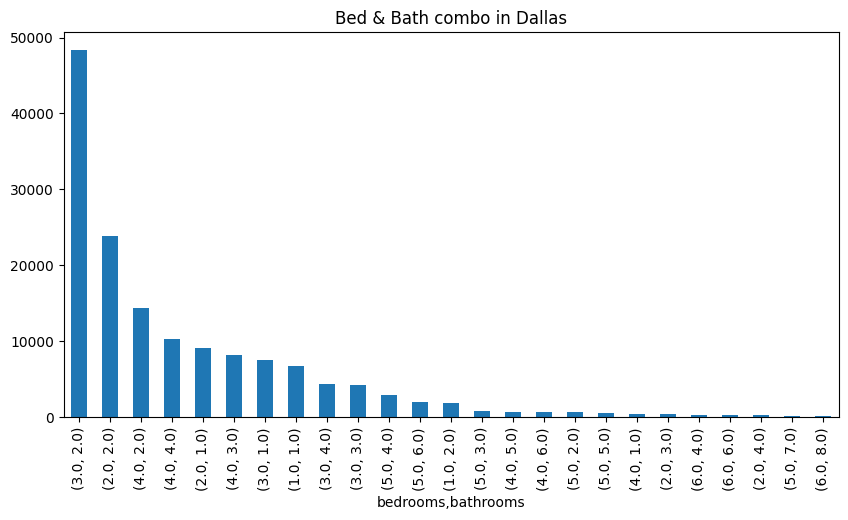

In [ ]:
filtered_dallas = df_dallas.groupby(['bedrooms','bathrooms'])
filtered_dallas.bedrooms.value_counts().nlargest(25).plot(kind='bar', title = "Bed & Bath combo in Dallas", figsize=(10,5))

**Austin**

In [ ]:
df_austin = df[df['city'] == 'Austin']
df_austin

,XCoord,YCoord,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,navigationPageLink,streetNumber,street,streetType,neighborhood,city,state,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceListed,priceLastKnown,normalPrice,pricePreClose,priceClosed,perSquareFoot,dateListed,daysOnMarket,buildingYearOpened,propertyType,Lot_Size,Style,Year_Built,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID,NAME,ST_ABBREV,STATE_NAME
2147,-97.749904,30.267309,57393,1,57393,216730,1.452485e+18,2,0,https://www.compass.com//listing/360-nueces-st...,360,Nueces,St,Market District,Austin,TX,78701.0,austin,-97.749904,30.267309,1.0,1.0,748.0,NaN,549000.0,549000.0,549000.0,NaN,NaN,734.0,2023-11-25 00:00:00,22.0,2008.0,Condo,100.0,Condominium,2008.0,748.0,100.0,0.0,4.845300e+11,4.845300e+08,TX,Texas
2148,-97.754148,30.269208,57394,1,57394,216738,1.461066e+18,2,0,https://www.compass.com//listing/restricted-ad...,300,Bowie,St,Spring Condominiums,Austin,TX,78703.0,austin,-97.754148,30.269208,1.0,1.0,565.0,NaN,499000.0,499000.0,499000.0,NaN,NaN,883.0,2023-12-07 00:00:00,11.0,2007.0,Condo,57.0,Condominium,2007.0,565.0,57.0,0.0,4.845300e+11,4.845300e+08,TX,Texas
2149,-97.749904,30.267309,57395,1,57395,216730,1.456731e+18,2,0,https://www.compass.com//listing/360-nueces-st...,360,Nueces,St,Market District,Austin,TX,78701.0,austin,-97.749904,30.267309,1.0,1.0,760.0,NaN,579000.0,579000.0,579000.0,NaN,NaN,762.0,2023-12-01 00:00:00,17.0,2008.0,Condo,100.0,Condominium,2008.0,760.0,100.0,0.0,4.845300e+11,4.845300e+08,TX,Texas
2150,-97.752111,30.267179,57396,1,57396,216738,1.460336e+18,2,0,https://www.compass.com//listing/222-west-aven...,222,West,Ave,Seaholm District,Austin,TX,78701.0,austin,-97.752111,30.267179,1.0,1.0,689.0,NaN,675000.0,675000.0,675000.0,NaN,NaN,980.0,2023-12-06 00:00:00,12.0,2014.0,Condo,196.0,Condominium,2014.0,689.0,196.0,0.0,4.845300e+11,4.845300e+08,TX,Texas
2151,-97.763694,30.264834,57397,1,57397,216750,1.398522e+18,2,0,https://www.compass.com//listing/1900-barton-s...,1900,Barton Springs,Rd,Zilker,Austin,TX,78704.0,austin,-97.763694,30.264834,1.0,1.0,698.0,NaN,460000.0,435000.0,447500.0,NaN,NaN,623.0,2023-09-23 00:00:00,97.0,2013.0,Condo,309.0,Condominium,2013.0,698.0,309.0,0.0,4.845300e+11,4.845300e+08,TX,Texas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3281679,-97.699889,30.383127,64103462,1,64103431,217266,3.150928e+17,2,10,https://www.compass.com//listing/1417-kramer-l...,1417,kramer,ln,North Austin,Austin,TX,78758,austin,-97.699889,30.383127,3.0,4.0,2104.0,NaN,429900.0,429900.0,431150.0,429900.0,434900.0,204.0,2019-12-14 00:00:00,113.0,2018.0,Condo,4195.0,Townhouse,2018.0,2008.0,4195.0,1.0,4.845304e+11,4.845304e+08,TX,Texas
3285345,-97.703518,30.265223,64397390,1,64397358,216708,1.476338e+18,2,0,https://www.compass.com//listing/1105-1-2-bras...,1105 1/2,Brass,St,Govalle,Austin,TX,78702,austin,-97.703518,30.265223,2.0,1.0,747.0,3659.0,450000.0,450000.0,450000.0,NaN,NaN,602.0,2023-12-28 00:00:00,3.0,1951.0,Single Family,8163.0,Single Family Residence,1951.0,728.0,3659.0,0.0,4.845300e+11,4.845300e+08,TX,Texas
3285346,-97.695372,30.270113,64397391,1,64397359,216868,1.471864e+18,2,0,https://www.compass.com//listing/3613-munson-s...,3613,Munson,St,Oak Springs,Austin,TX,78721,austin,-97.695372,30.270113,3.0,4.0,2192.0,7344.0,920000.0,920000.0,920000.0,NaN,NaN,420.0,2023-12-22 00:00:00,9.0,2023.0,Single Family,NaN,NaN,NaN,NaN,7344.0,1.0,4.845300e+11,4.845300e+08,TX,Texas
3285347,-97.695322,30.270285,64397392,1,64397360,216868,1.471854e+18,2,0,https://www.compass.com//listing/3611-munson-s...,3611,Munson,St,Oak Springs,Austin,TX,78721,austin,-97.695322,30.270285,4.0,4.0,2277.0,3563.0,956000.0,956000.0,956000.0,NaN,NaN,420.0,2023-12-22 00:00:00,9.0,2023.0,Single Family,10812.0,Single Family Residence,1935.0,529.0,3563.0,1.0,4.845300e+1

In [ ]:
lat_lon_pairs = list(zip(list(df_austin.latitude), list(df_austin.longitude)))
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

<Axes: title={'center': 'Bed & Bath combo in Austin'}, xlabel='bedrooms,bathrooms'>

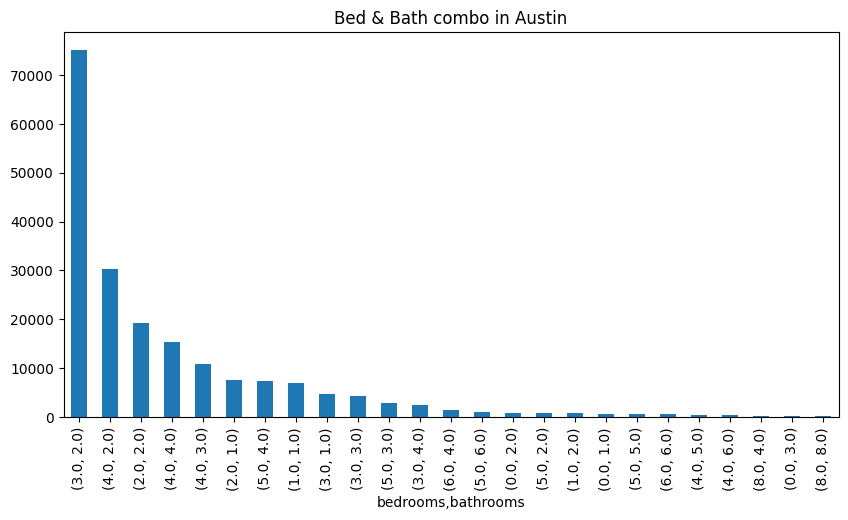

In [ ]:
filtered_austin = df_austin.groupby(['bedrooms','bathrooms'])
filtered_austin.bedrooms.value_counts().nlargest(25).plot(kind='bar', title = "Bed & Bath combo in Austin", figsize=(10,5))

**San Antonio**

In [ ]:
df_sanAntonio = df[df['city'] == 'San Antonio']
df_sanAntonio

,XCoord,YCoord,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,navigationPageLink,streetNumber,street,streetType,neighborhood,city,state,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceListed,priceLastKnown,normalPrice,pricePreClose,priceClosed,perSquareFoot,dateListed,daysOnMarket,buildingYearOpened,propertyType,Lot_Size,Style,Year_Built,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID,NAME,ST_ABBREV,STATE_NAME
4935,-98.366716,29.460954,75830,1,75830,200852,1.465342e+18,2,0,https://www.compass.com//listing/5940-glacier-...,5940,Glacier Sun,Dr,Sunrise,San Antonio,TX,78244.0,san_antonio,-98.366716,29.460954,3.0,2.0,1200.0,6621.0,180000.0,180000.0,180000.0,NaN,NaN,150.0,2023-12-13 00:00:00,6.0,1983.0,Single Family,6621.0,Single Family Residence,1983.0,1200.0,6621.0,0.0,4.802913e+11,4.802913e+08,TX,Texas
4936,-98.367661,29.465269,75831,1,75831,200852,1.464573e+18,2,0,https://www.compass.com//listing/4106-hunters-...,4106,Hunters Sun,Dr,Sunrise,San Antonio,TX,78244.0,san_antonio,-98.367661,29.465269,3.0,2.0,1131.0,4835.0,215000.0,215000.0,215000.0,NaN,NaN,190.0,2023-12-12 00:00:00,7.0,1985.0,Single Family,4835.0,Single Family Residence,1985.0,1131.0,4835.0,0.0,4.802913e+11,4.802913e+08,TX,Texas
4938,-98.365390,29.461353,75833,1,75833,200852,1.458780e+18,2,0,https://www.compass.com//listing/5972-glacier-...,5972,Glacier Sun,Dr,Sunrise,San Antonio,TX,78244.0,san_antonio,-98.365390,29.461353,3.0,2.0,1120.0,8450.0,210000.0,210000.0,210000.0,NaN,NaN,188.0,2023-12-07 00:00:00,14.0,1985.0,Single Family,8451.0,Single Family Residence,1985.0,1120.0,8450.0,0.0,4.802913e+11,4.802913e+08,TX,Texas
4939,-98.361409,29.471054,75834,1,75834,200847,1.458937e+18,2,0,https://www.compass.com//listing/4726-crystal-...,4726,Crystal,Farm,Sunrise,San Antonio,TX,78244.0,san_antonio,-98.361409,29.471054,3.0,2.0,1064.0,5501.0,210000.0,210000.0,210000.0,NaN,NaN,197.0,2023-12-07 00:00:00,14.0,1999.0,Single Family,5489.0,Single Family Residence,1999.0,1064.0,5501.0,0.0,4.802913e+11,4.802913e+08,TX,Texas
4940,-98.369397,29.472753,75835,1,75835,200846,1.456550e+18,2,0,https://www.compass.com//listing/4910-sunset-b...,4910,Sunset,Bluff,Meadow Park,San Antonio,TX,78244.0,san_antonio,-98.369397,29.472753,4.0,2.0,1835.0,5357.0,255000.0,255000.0,255000.0,NaN,NaN,139.0,2023-12-04 00:00:00,17.0,2006.0,Single Family,5358.0,Single Family Residence,2006.0,1835.0,5357.0,0.0,4.802913e+11,4.802913e+08,TX,Texas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3288259,-98.485786,29.517485,64686817,1,64686784,201557,5.923650e+16,2,10,https://www.compass.com//listing/607-east-rect...,607,Rector,St,Shearer Hills-Ridgeview,San Antonio,TX,78216,san_antonio,-98.485786,29.517485,3.0,2.0,1357.0,8276.0,99000.0,99000.0,99000.0,99000.0,99000.0,73.0,2013-10-06 00:00:00,68.0,1960.0,Single Family,8276.0,Single Family Residence,1959.0,1357.0,8276.0,0.0,4.802919e+11,4.802919e+08,TX,Texas
3288260,-98.486840,29.517482,64686818,1,64686785,201557,5.914371e+16,2,10,https://www.compass.com//listing/519-east-rect...,519,Rector,St,Shearer Hills-Ridgeview,San Antonio,TX,78216,san_antonio,-98.486840,29.517482,3.0,1.0,1016.0,NaN,94500.0,94500.0,94500.0,94500.0,94500.0,93.0,2006-08-22 00:00:00,17.0,1960.0,Single Family,9191.0,Single Family Residence,1959.0,1016.0,9191.0,0.0,4.802919e+11,4.802919e+08,TX,Texas
3288261,-98.489413,29.517497,64686819,1,64686786,201557,5.926103e+16,2,10,https://www.compass.com//listing/411-east-rect...,411,Rector,St,Shearer Hills-Ridgeview,San Antonio,TX,78216,san_antonio,-98.489413,29.517497,3.0,2.0,1351.0,10454.0,125000.0,125000.0,123750.0,125000.0,120000.0,93.0,2017-04-04 00:00:00,22.0,1959.0,Single Family,10454.0,Single Family Residence,1959.0,1350.0,10454.0,0.0,4.802919e+11,4.802919e+08,TX,Texas
3288262,-98.486326,29.517470,64686820,1,64686787,201557,4.259052e+17

In [ ]:
lat_lon_pairs = list(zip(list(df_sanAntonio.latitude), list(df_sanAntonio.longitude)))
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

<Axes: title={'center': 'Bed & Bath combo in San Antonio'}, xlabel='bedrooms,bathrooms'>

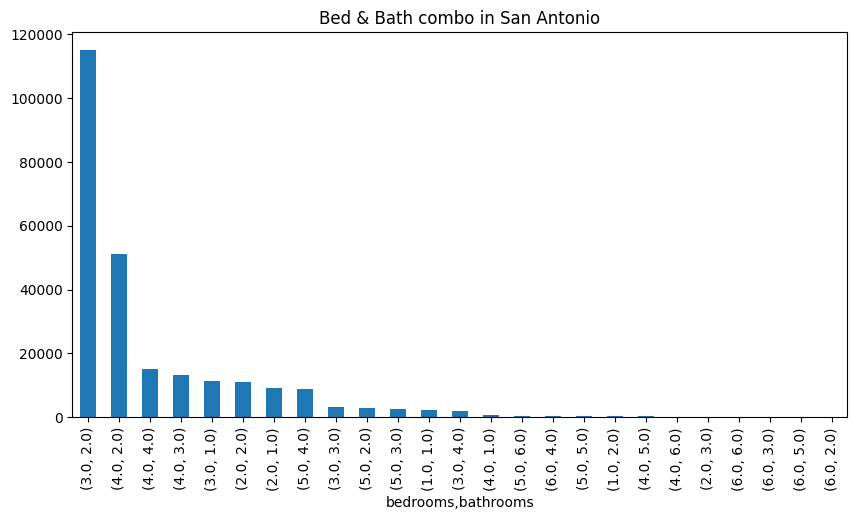

In [ ]:
filtered_sanAntonio = df_sanAntonio.groupby(['bedrooms','bathrooms'])
filtered_sanAntonio.bedrooms.value_counts().nlargest(25).plot(kind='bar', title = "Bed & Bath combo in San Antonio", figsize=(10,5))

**Fort Worth**

In [ ]:
df_fortWorth = df[df['city'] == 'Fort Worth']
df_fortWorth

,XCoord,YCoord,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,navigationPageLink,streetNumber,street,streetType,neighborhood,city,state,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceListed,priceLastKnown,normalPrice,pricePreClose,priceClosed,perSquareFoot,dateListed,daysOnMarket,buildingYearOpened,propertyType,Lot_Size,Style,Year_Built,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID,NAME,ST_ABBREV,STATE_NAME
19878,-97.280818,32.969260,277642,1,277642,216163,1.461098e+18,2,0,https://www.compass.com//listing/13317-evergre...,13317,Evergreen,Dr,North Central Tarrant County,Fort Worth,TX,76244.0,dallas,-97.280818,32.969260,3.0,2.0,1796.0,5488.0,325000.0,325000.0,325000.0,NaN,NaN,181.0,2023-12-07 00:00:00,11.0,2003.0,Single Family,5497.0,Single Family Residence,2003.0,1796.0,5488.0,0.0,4.843911e+11,4.843911e+08,TX,Texas
19879,-97.278373,32.959292,277643,1,277643,216165,1.461225e+18,2,0,https://www.compass.com//listing/3805-grantsvi...,3805,Grantsville,Dr,McPherson Ranch,Fort Worth,TX,76244.0,dallas,-97.278373,32.959292,3.0,2.0,1455.0,5488.0,340000.0,340000.0,340000.0,NaN,NaN,234.0,2023-12-10 00:00:00,11.0,2004.0,Single Family,5497.0,Single Family Residence,2004.0,1455.0,5488.0,0.0,4.843911e+11,4.843911e+08,TX,Texas
19880,-97.266298,32.970326,277644,1,277644,216164,1.451812e+18,2,0,https://www.compass.com//listing/13317-padre-a...,13317,Padre,Ave,North Central Tarrant County,Fort Worth,TX,76244.0,dallas,-97.266298,32.970326,4.0,2.0,2784.0,4791.0,410000.0,399000.0,404500.0,NaN,NaN,143.0,2023-11-29 00:00:00,24.0,2006.0,Single Family,4792.0,Single Family Residence,2006.0,2784.0,4791.0,0.0,4.843911e+11,4.843911e+08,TX,Texas
19881,-97.272135,32.966834,277645,1,277645,216164,1.459899e+18,2,0,https://www.compass.com//listing/4120-broken-b...,4120,Broken Bend,Blvd,North Central Tarrant County,Fort Worth,TX,76244.0,dallas,-97.272135,32.966834,4.0,2.0,2711.0,7492.0,420000.0,420000.0,420000.0,NaN,NaN,155.0,2023-12-09 00:00:00,11.0,2002.0,Single Family,7497.0,Single Family Residence,2002.0,2711.0,7492.0,0.0,4.843911e+11,4.843911e+08,TX,Texas
19882,-97.267668,32.966669,277646,1,277646,216164,1.456919e+18,2,0,https://www.compass.com//listing/13117-settler...,13117,Settlers,Trail,North Central Tarrant County,Fort Worth,TX,76244.0,dallas,-97.267668,32.966669,3.0,2.0,2764.0,6098.0,355000.0,355000.0,355000.0,NaN,NaN,128.0,2023-12-05 00:00:00,14.0,2004.0,Single Family,6094.0,Single Family Residence,2004.0,2764.0,6098.0,0.0,4.843911e+11,4.843911e+08,TX,Texas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3283850,-97.252590,32.762832,64301765,1,64301733,215454,2.530240e+16,2,10,https://www.compass.com//listing/901-green-riv...,901,Green River,Trl,White Lake Hills,Fort Worth,TX,76103,dallas,-97.252590,32.762832,3.0,2.0,1837.0,9147.0,120000.0,120000.0,120000.0,120000.0,120000.0,65.0,2007-04-10 00:00:00,2.0,1964.0,Single Family,9213.0,Single Family Residence,1964.0,1980.0,9147.0,0.0,4.843911e+11,4.843911e+08,TX,Texas
3283851,-97.248324,32.763638,64301766,1,64301734,215454,2.529585e+16,2,10,https://www.compass.com//listing/5016-granite-...,5016,Granite Shoals,Ave,White Lake Hills,Fort Worth,TX,76103,dallas,-97.248324,32.763638,4.0,2.0,2343.0,10454.0,129500.0,129500.0,124125.0,129500.0,108000.0,55.0,2005-08-01 00:00:00,49.0,1968.0,Single Family,10637.0,Single Family Residence,1968.0,2343.0,10454.0,0.0,4.843911e+11,4.843911e+08,TX,Texas
3283852,-97.251523,32.764998,64301767,1,64301735,215453,2.527356e+16,2,10,https://www.compass.com//listing/4850-marble-f...,4850,Marble Falls,Ct,White Lake Hills,Fort Worth,TX,76103,dallas,-97.251523,32.764998,4.0,2.0,2709.0,10890.0,179000.0,179000.0,178500.0,179000.0,177000.0,66.0,2006-03-21 00:00:00,12.0,1990.0,Single Family,10999.0,Single Family Residence,1990.0,2709.0,10890.0,0.0,4.843911e+11,4.843911e+08,T

In [ ]:
lat_lon_pairs = list(zip(list(df_fortWorth.latitude), list(df_fortWorth.longitude)))
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

<Axes: title={'center': 'Bed & Bath combo in Fort Worth'}, xlabel='bedrooms,bathrooms'>

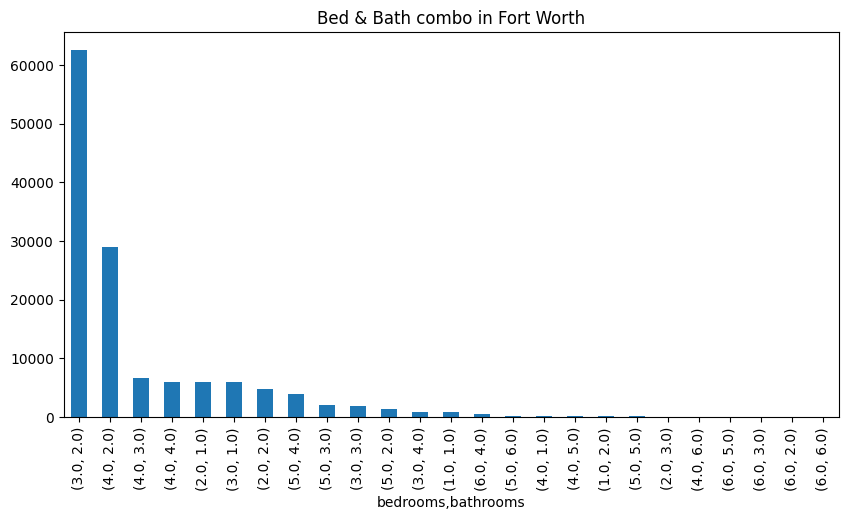

In [ ]:
filtered_fortWorth = df_fortWorth.groupby(['bedrooms','bathrooms'])
filtered_fortWorth.bedrooms.value_counts().nlargest(25).plot(kind='bar', title = "Bed & Bath combo in Fort Worth", figsize=(10,5))

**Waco**

In [ ]:
df_waco = df[df['city'] == 'Waco']
df_waco

,XCoord,YCoord,OBJECTID,Join_Count,TARGET_FID,JOIN_FID,listingIdSHA,listingType,status,navigationPageLink,streetNumber,street,streetType,neighborhood,city,state,zipCode,geoId,longitude,latitude,bedrooms,bathrooms,squareFeet,lotSizeInSquareFeet,priceListed,priceLastKnown,normalPrice,pricePreClose,priceClosed,perSquareFoot,dateListed,daysOnMarket,buildingYearOpened,propertyType,Lot_Size,Style,Year_Built,Total_Finished_SqFt,lotSizeInSqFt,newConstructionSaleCategorical,ID,NAME,ST_ABBREV,STATE_NAME
29470,-97.166336,31.565457,367314,1,367314,212905,1.466277e+18,2,0,https://www.compass.com//listing/2114-lyle-ave...,2114,Lyle,Ave,Farwell Heights,Waco,TX,76708.0,austin,-97.166336,31.565457,2.0,1.0,1287.0,8232.0,200000.0,200000.0,200000.0,NaN,NaN,155.0,2023-12-14 00:00:00,4.0,1920.0,Single Family,8233.0,Single Family Residence,1920.0,1287.0,8232.0,0.0,4.830900e+11,4.830900e+08,TX,Texas
29471,-97.153325,31.569251,367315,1,367315,212908,1.456633e+18,2,0,https://www.compass.com//listing/707-proctor-a...,707,Proctor,Ave,Brook Oaks,Waco,TX,76708.0,austin,-97.153325,31.569251,3.0,2.0,1373.0,9147.0,299900.0,299900.0,299900.0,NaN,NaN,218.0,2023-12-01 00:00:00,18.0,2023.0,Single Family,9322.0,Residential,1925.0,1204.0,9147.0,1.0,4.830900e+11,4.830900e+08,TX,Texas
29472,-97.164064,31.566604,367316,1,367316,212905,1.455466e+18,2,0,https://www.compass.com//listing/1920-lyle-ave...,1920,Lyle,Ave,Farwell Heights,Waco,TX,76708.0,austin,-97.164064,31.566604,4.0,2.0,1519.0,8232.0,237000.0,237000.0,237000.0,NaN,NaN,156.0,2023-11-29 00:00:00,19.0,1963.0,Multi Family,8233.0,Multi-Family Res (5+ Units),1963.0,1519.0,8232.0,0.0,4.830900e+11,4.830900e+08,TX,Texas
29473,-97.171575,31.568026,367317,1,367317,212906,1.461168e+18,2,0,https://www.compass.com//listing/2326-reuter-a...,2326,Reuter,Ave,Farwell Heights,Waco,TX,76708.0,austin,-97.171575,31.568026,4.0,2.0,1740.0,8250.0,250000.0,250000.0,250000.0,NaN,NaN,NaN,2023-12-07 00:00:00,12.0,2003.0,Single Family,8233.0,Single Family Residence,2003.0,1740.0,8250.0,0.0,4.830900e+11,4.830900e+08,TX,Texas
29474,-97.173786,31.569563,367318,1,367318,212906,1.463361e+18,2,0,https://www.compass.com//listing/2416-mcferrin...,2416,McFerrin,Ave,Farwell Heights,Waco,TX,76708.0,austin,-97.173786,31.569563,2.0,1.0,1000.0,43560000.0,85000.0,85000.0,85000.0,NaN,NaN,NaN,2023-12-09 00:00:00,10.0,1925.0,Single Family,8233.0,Single Family Residence,1925.0,1000.0,43560000.0,0.0,4.830900e+11,4.830900e+08,TX,Texas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3275819,-97.120485,31.566673,63834939,1,63834908,212917,1.134710e+18,2,10,https://www.compass.com//listing/804-earle-ave...,804,Earle,Ave,East Riverside,Waco,TX,76704,austin,-97.120485,31.566673,NaN,NaN,1744.0,NaN,319990.0,NaN,319990.0,319990.0,319990.0,NaN,2022-10-21 00:00:00,46.0,2022.0,Multi Family,NaN,NaN,NaN,NaN,NaN,1.0,4.830900e+11,4.830900e+08,TX,Texas
3275825,-97.119839,31.570107,63834945,1,63834914,212917,1.038391e+18,2,10,https://www.compass.com//listing/1015-elm-aven...,1015,Elm,Ave,East Riverside,Waco,TX,76704,austin,-97.119839,31.570107,NaN,NaN,1658.0,0.0,7900.0,NaN,7900.0,7900.0,7900.0,NaN,2018-01-21 00:00:00,109.0,1935.0,Land,9017.0,Residential,1935.0,1658.0,0.0,0.0,4.830900e+11,4.830900e+08,TX,Texas
3275826,-97.112989,31.564252,63834946,1,63834915,212919,1.038499e+18,2,10,https://www.compass.com//listing/1008-east-cal...,1008,Calhoun,Ave,East Riverside,Waco,TX,76704,austin,-97.112989,31.564252,NaN,NaN,528.0,6969.0,14900.0,NaN,14900.0,14900.0,14900.0,NaN,2014-12-30 00:00:00,43.0,NaN,Land,7013.0,Residential,NaN,528.0,6969.0,NaN,4.830900e+11,4.830900e+08,TX,Texas
3275829,-97.113693,31.564263,63834949,1,63834918,212919,9.164022e+17,2,10,https://www.compass.com//listing/1003-east-cla...,1003,Clay,Ave,East Riverside,Waco,TX,76704,austin,-97.113693,31.564263,NaN,NaN,1020.0,6969.0,25000.0,NaN,22733.0,25000.0,18200.0,NaN,2020-06-27 00:00:00,15

In [ ]:
lat_lon_pairs = list(zip(list(df_waco.latitude), list(df_waco.longitude)))
map = folium.Map()
HeatMap(lat_lon_pairs).add_to(map)
map

<Axes: title={'center': 'Bed & Bath combo in waco'}, xlabel='bedrooms,bathrooms'>

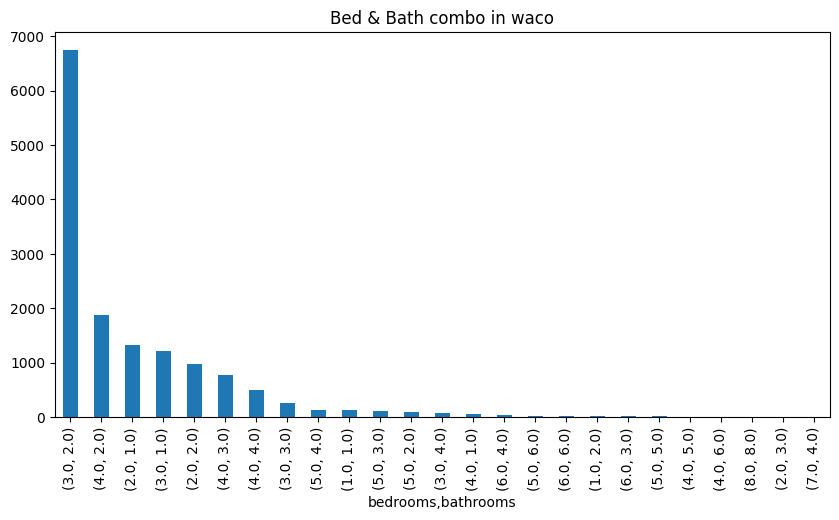

In [ ]:
filtered_waco = df_waco.groupby(['bedrooms','bathrooms'])
filtered_waco.bedrooms.value_counts().nlargest(25).plot(kind='bar', title = "Bed & Bath combo in waco", figsize=(10,5))

##Second model


In [ ]:
# Creating a Neural Network Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split